# Image Style Transfer

## Imports

In [25]:
import sys
sys.path.append('src')

import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from scipy import ndimage
import random

# Import the StyleTransfer class
from style_transfer import StyleTransfer

## Load and Display Images

Content Image:


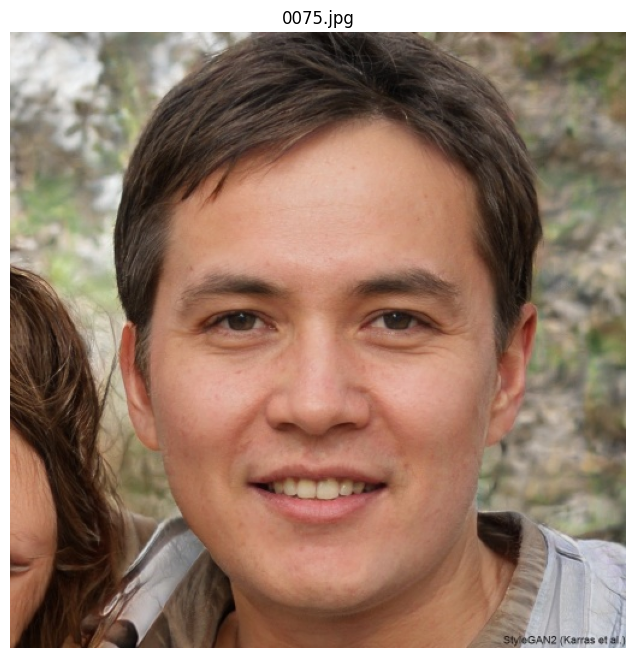

Style Reference Image:


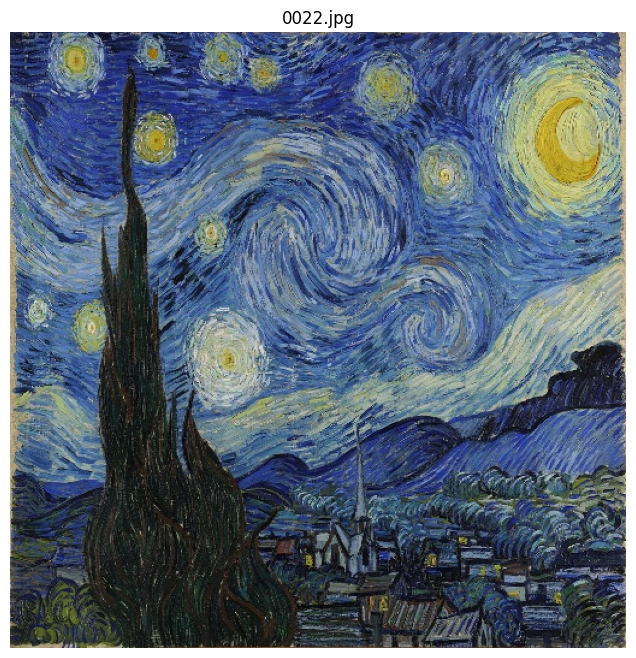

In [26]:
def display_image(img_path):
    """Display an image from file"""
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error: Could not load image from {img_path}")
        return
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(os.path.basename(img_path))
    plt.show()

# Display source images
# Updated paths to use the new images
content_path = "assets/input/0075.jpg"  # Portrait image
style_path = "assets/reference/0022.jpg"  # Starry Night

# Check if files exist, otherwise fall back to original paths
if not os.path.exists(content_path):
    content_path = "assets/input/download.jpg"
    print(f"New content image not found, using default: {content_path}")
    
if not os.path.exists(style_path):
    style_path = "assets/reference/classical_art.jpg"
    print(f"New style image not found, using default: {style_path}")

print("Content Image:")
display_image(content_path)

print("Style Reference Image:")
display_image(style_path)

## Apply Style Transfer

Applying style transfer with 'balanced' preset...
Loading and preprocessing images...
Applying balanced style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...


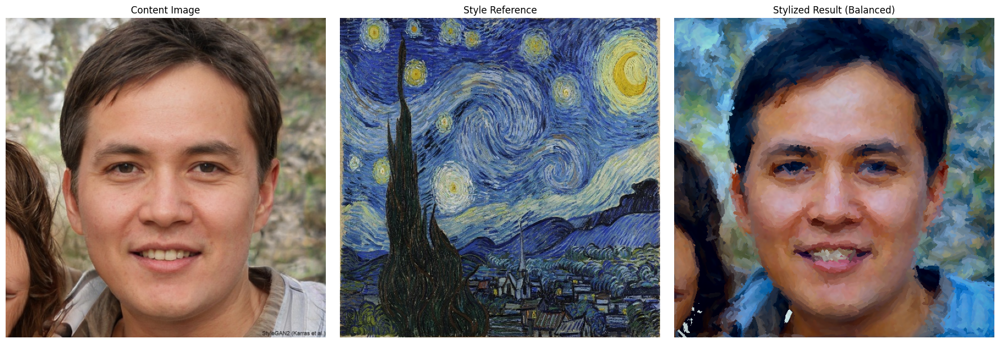

Result saved to assets/_results/style_balanced.png


In [27]:
# Initialize the style transfer instance
style_transfer = StyleTransfer()

# Define output directory
output_dir = "assets/_results"
os.makedirs(output_dir, exist_ok=True)

# Apply style transfer with balanced preset
print("Applying style transfer with 'balanced' preset...")
content, style, result = style_transfer.process(
    content_path, style_path, 
    target_size=(512, 512),
    preset="balanced"
)

# Display results
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(content)
plt.title("Content Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(style)
plt.title("Style Reference")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(result)
plt.title("Stylized Result (Balanced)")
plt.axis("off")

plt.tight_layout()
plt.show()

# Save the result
output_path = os.path.join(output_dir, "style_balanced.png")
result_display = (result * 255).astype(np.uint8)
cv2.imwrite(output_path, cv2.cvtColor(result_display, cv2.COLOR_RGB2BGR))
print(f"Result saved to {output_path}")

## Try Different Presets


Applying style transfer with 'painterly' preset...
Loading and preprocessing images...
Applying painterly style transfer...
Applying painterly smoothing...


Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/style_painterly.png

Applying style transfer with 'classical' preset...
Loading and preprocessing images...
Applying classical style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/style_classical.png

Applying style transfer with 'dramatic' preset...
Loading and preprocessing images...
Applying dramatic style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/style_dramatic.png


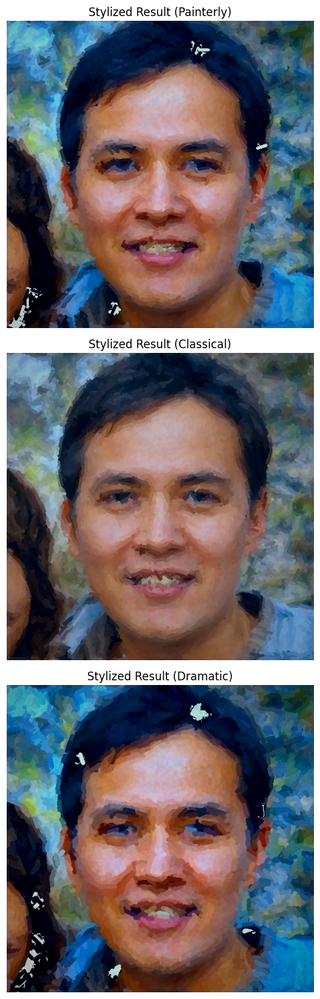

In [28]:
# Available presets
presets = ["painterly", "classical", "dramatic"]

# Apply and display each preset
plt.figure(figsize=(15, 5 * len(presets)))

for i, preset in enumerate(presets):
    print(f"\nApplying style transfer with '{preset}' preset...")
    _, _, result = style_transfer.process(
        content_path, style_path, 
        target_size=(512, 512),
        preset=preset
    )
    
    # Display result
    plt.subplot(len(presets), 1, i+1)
    plt.imshow(result)
    plt.title(f"Stylized Result ({preset.capitalize()})")
    plt.axis("off")
    
    # Save result
    output_path = os.path.join(output_dir, f"style_{preset}.png")
    result_display = (result * 255).astype(np.uint8)
    cv2.imwrite(output_path, cv2.cvtColor(result_display, cv2.COLOR_RGB2BGR))
    print(f"Result saved to {output_path}")

plt.tight_layout()
plt.show()

## Feature Extraction

In [29]:
import json
import subprocess
import sys

# Import the feature extraction module
from feature_extraction import process_all_images, process_image, extract_all_features

# Get the base filename from content path without extension
content_filename = os.path.splitext(os.path.basename(content_path))[0]

# Process the current content image
print(f"Extracting features from {content_path}...")
process_image(content_path, "assets/_results")

# Load and display extracted features
features_path = os.path.join("assets/_results", f"{content_filename}_features.json")
if os.path.exists(features_path):
    with open(features_path, 'r') as f:
        features = json.load(f)
    
    # Display some key features
    print("\nExtracted Features Summary:")
    print(f"Image: {features['image_info']['filename']}")
    print(f"Dimensions: {features['image_info']['width']}x{features['image_info']['height']}")
    print(f"Aspect Ratio: {features['image_info']['aspect_ratio']:.2f}")
    print("\nColor Features:")
    print(f"Mean Hue: {features['color_features']['mean_hue']:.2f}")
    print(f"Mean Saturation: {features['color_features']['mean_saturation']:.2f}")
    print(f"Mean Value: {features['color_features']['mean_value']:.2f}")
    print("\nTexture Features:")
    print(f"Contrast: {features['texture_features']['contrast']:.4f}")
    print(f"Homogeneity: {features['texture_features']['homogeneity']:.4f}")
    print(f"Energy: {features['texture_features']['energy']:.4f}")
    print("\nShape Features:")
    print(f"Edge Density: {features['shape_features']['edge_density']:.4f}")
    print(f"Number of Contours: {features['shape_features']['num_contours']}")
else:
    print(f"\nFeatures file not found at {features_path}")

Extracting features from assets/input/0075.jpg...
Processed assets/input/0075.jpg and saved results to assets/_results

Extracted Features Summary:
Image: 0075.jpg
Dimensions: 512x512
Aspect Ratio: 1.00

Color Features:
Mean Hue: 17.18
Mean Saturation: 91.34
Mean Value: 143.31

Texture Features:
Contrast: 67.2298
Homogeneity: 0.3511
Energy: 0.0004

Shape Features:
Edge Density: 0.0392
Number of Contours: 302


## Visualize Feature Extraction Results

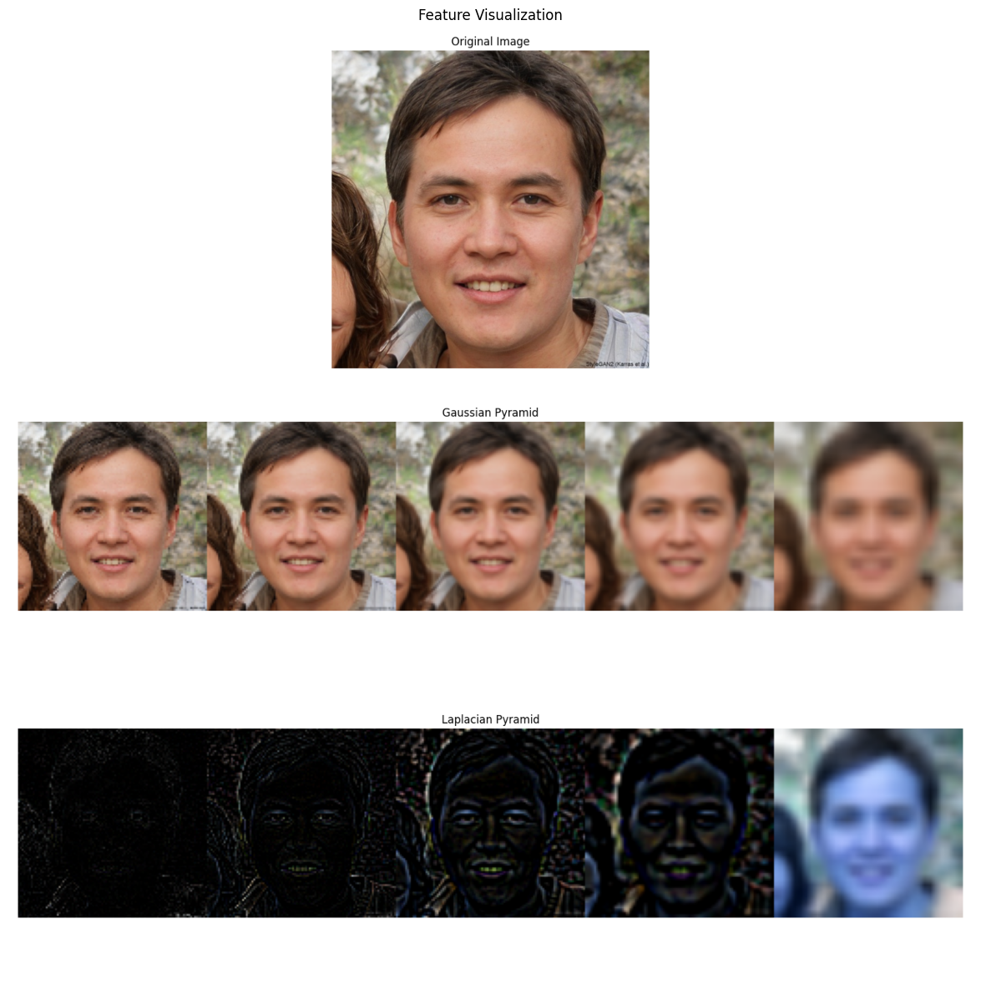

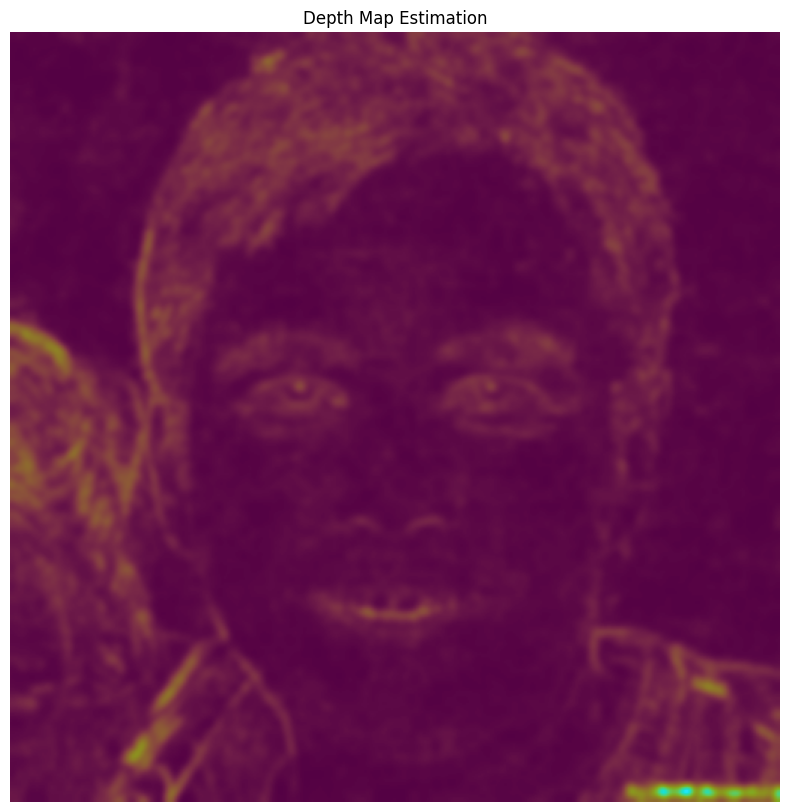

In [30]:
# Display the visualization generated by the feature extraction
viz_path = os.path.join("assets/_results", f"{content_filename}_visualization.png")
if os.path.exists(viz_path):
    img = cv2.imread(viz_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(15, 15))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Feature Visualization")
    plt.show()
else:
    print(f"Visualization file not found at {viz_path}")

# Display depth map
depth_path = os.path.join("assets/_results", f"{content_filename}_depth_map.png")
if os.path.exists(depth_path):
    img = cv2.imread(depth_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title("Depth Map Estimation")
    plt.show()
else:
    print(f"Depth map file not found at {depth_path}")

Applying painterly style transfer to 0075.jpg with style 0022.jpg...
Loading and preprocessing images...
Applying painterly style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/0075_0022_painterly.png
Applying painterly style transfer to 0075.jpg with style 0005.jpg...
Loading and preprocessing images...
Applying painterly style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/0075_0005_painterly.png
Applying painterly style transfer to 0002.jpg with style 0022.jpg...
Loading and preprocessing images...
Applying painterly style transfer...
Applying painterly smoothing...
Transferring color palette...


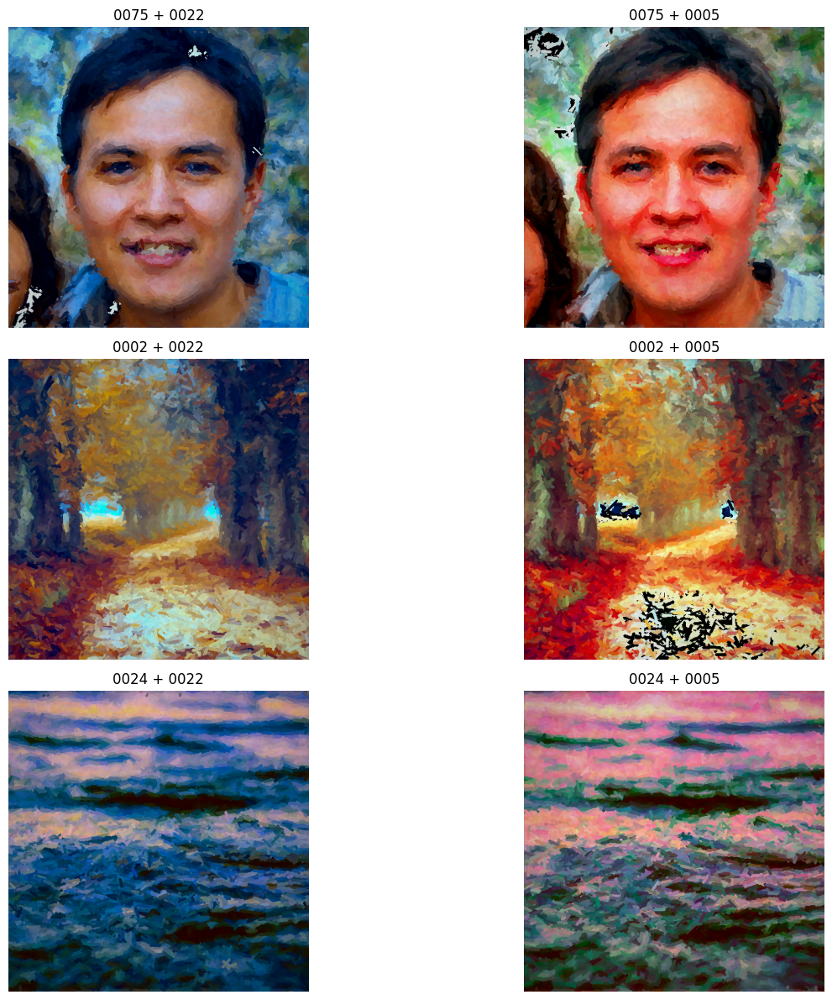

In [31]:
# Test Different Content-Style Pairs

def apply_style_transfer(content_path, style_path, preset="balanced", output_name=None):
    print(f"Applying {preset} style transfer to {os.path.basename(content_path)} with style {os.path.basename(style_path)}...")
    
    if output_name is None:
        content_name = os.path.splitext(os.path.basename(content_path))[0]
        style_name = os.path.splitext(os.path.basename(style_path))[0]
        output_name = f"{content_name}_{style_name}_{preset}"
    
    # Apply style transfer
    content, style, result = style_transfer.process(
        content_path, style_path, 
        target_size=(512, 512),
        preset=preset
    )
    
    # Save the result
    output_path = os.path.join(output_dir, f"{output_name}.png")
    result_display = (result * 255).astype(np.uint8)
    cv2.imwrite(output_path, cv2.cvtColor(result_display, cv2.COLOR_RGB2BGR))
    print(f"Result saved to {output_path}")
    
    return content, style, result

# Test a few different content-style pairs
content_images = [
    "assets/input/0075.jpg", 
    "assets/input/0002.jpg",
    "assets/input/0024.jpg",
]

style_images = [
    "assets/reference/0022.jpg",
    "assets/reference/0005.jpg",
]

# Create a 3x2 grid to display results
plt.figure(figsize=(15, 12))

for i, content_path in enumerate(content_images):
    for j, style_path in enumerate(style_images):
        # Skip if file doesn't exist
        if not os.path.exists(content_path) or not os.path.exists(style_path):
            print(f"Skipping: {content_path} or {style_path} does not exist")
            continue
        
        # Apply style transfer
        content_name = os.path.splitext(os.path.basename(content_path))[0]
        style_name = os.path.splitext(os.path.basename(style_path))[0]
        _, _, result = apply_style_transfer(
            content_path, style_path, 
            preset="painterly",
            output_name=f"{content_name}_{style_name}_painterly"
        )
        
        # Display in grid
        plt.subplot(3, 2, i*2 + j + 1)
        plt.imshow(result)
        plt.title(f"{content_name} + {style_name}")
        plt.axis("off")

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "style_transfer_comparison.png"))
plt.show()

Extracting features from assets/input/0075.jpg...
Processed assets/input/0075.jpg and saved results to assets/_results


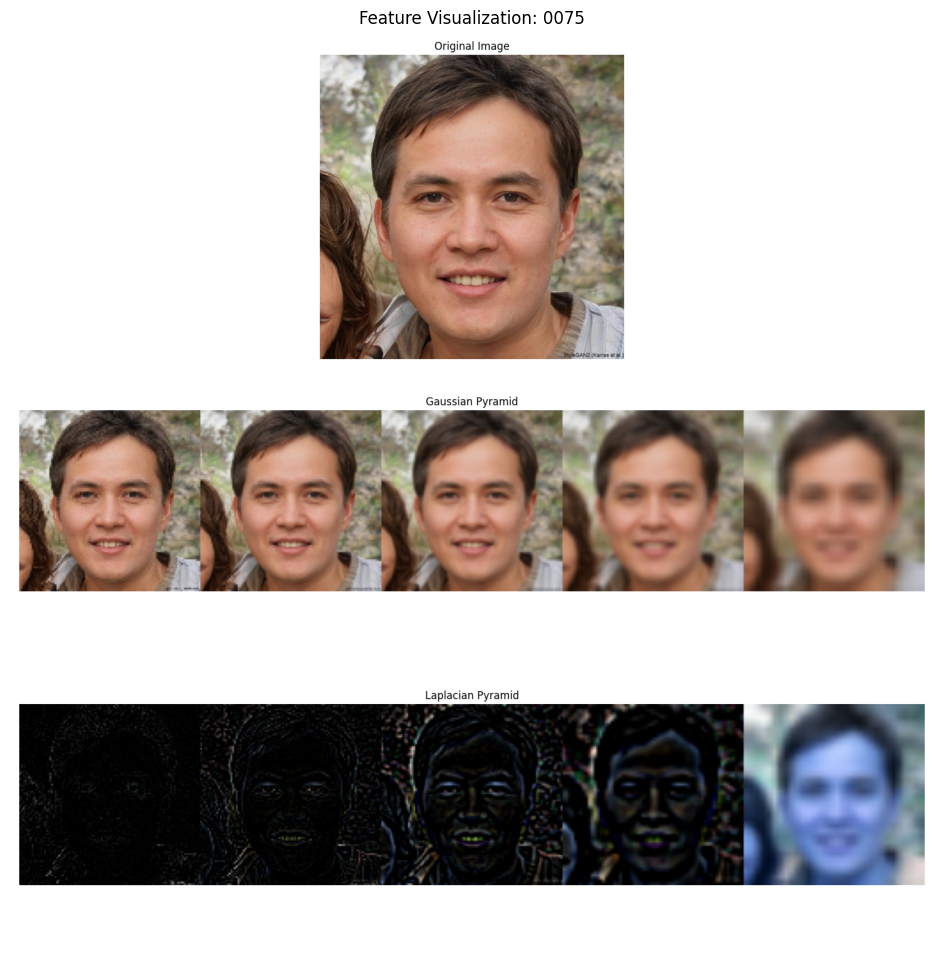

Extracting features from assets/input/0002.jpg...
Processed assets/input/0002.jpg and saved results to assets/_results


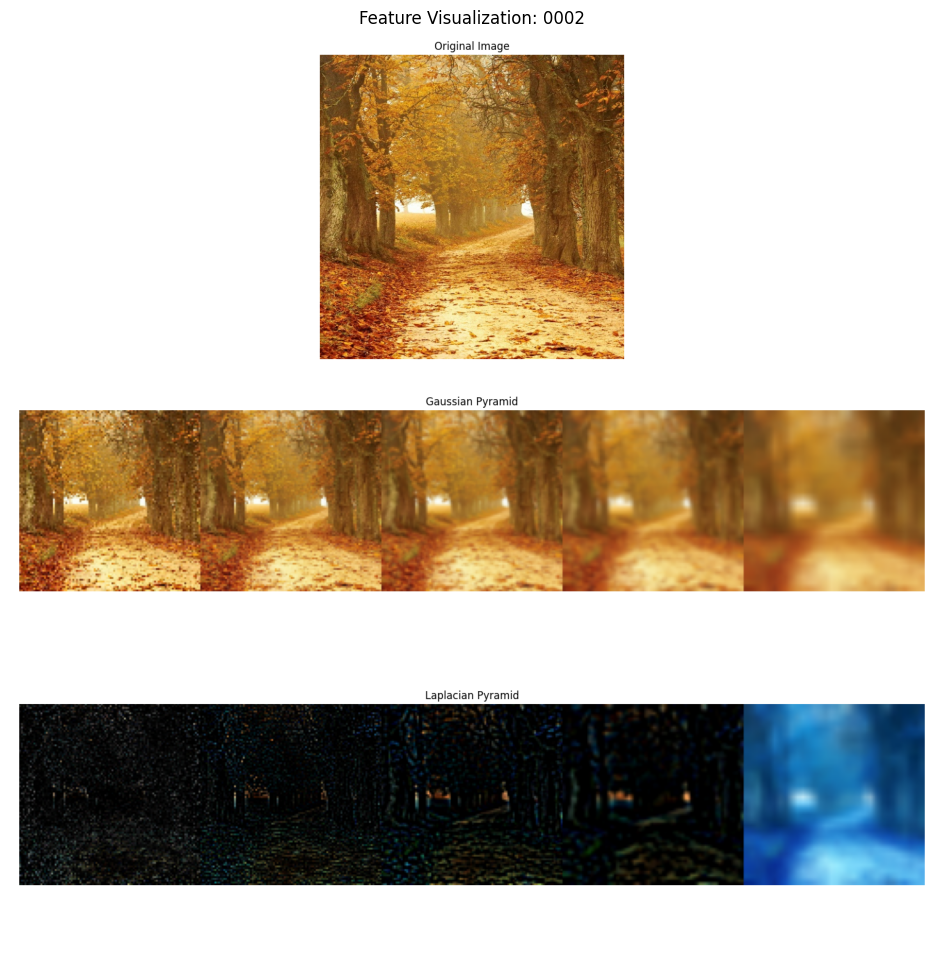

Extracting features from assets/input/0024.jpg...
Processed assets/input/0024.jpg and saved results to assets/_results


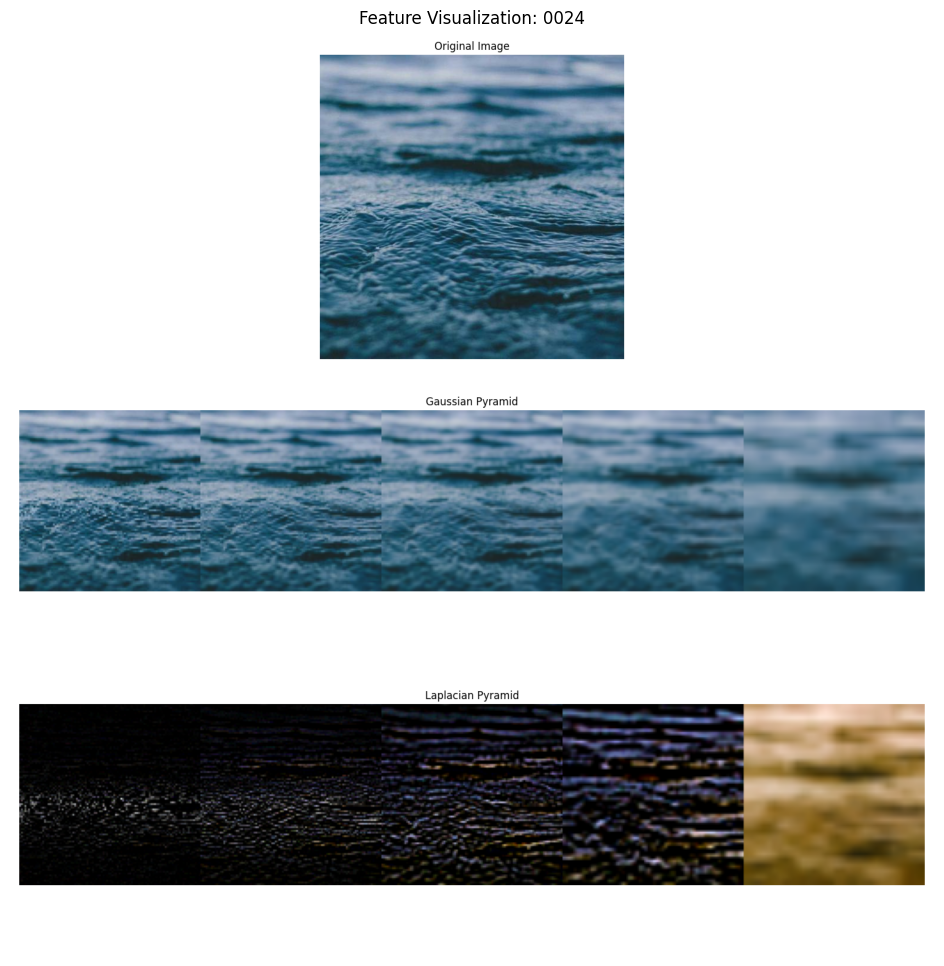

In [32]:
# Feature Extraction for Multiple Images

def process_multiple_images(image_paths, output_dir="assets/_results"):
    os.makedirs(output_dir, exist_ok=True)
    
    for img_path in image_paths:
        if not os.path.exists(img_path):
            print(f"Image {img_path} does not exist. Skipping.")
            continue
            
        print(f"Extracting features from {img_path}...")
        process_image(img_path, output_dir)
        
        # Get the base filename without extension
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        
        # Display visualization if available
        viz_path = os.path.join(output_dir, f"{base_name}_visualization.png")
        if os.path.exists(viz_path):
            img = cv2.imread(viz_path)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(12, 12))
            plt.imshow(img_rgb)
            plt.axis('off')
            plt.title(f"Feature Visualization: {base_name}")
            plt.show()

# Process some of our content images
sample_images = [
    "assets/input/0075.jpg",
    "assets/input/0002.jpg",
    "assets/input/0024.jpg",
]

process_multiple_images(sample_images)

Selected 3 content images:
  - 0029.jpg
  - 0040.jpg
  - 0034.jpg

Selected 2 style images:
  - 0009.jpg
  - 0029.jpg


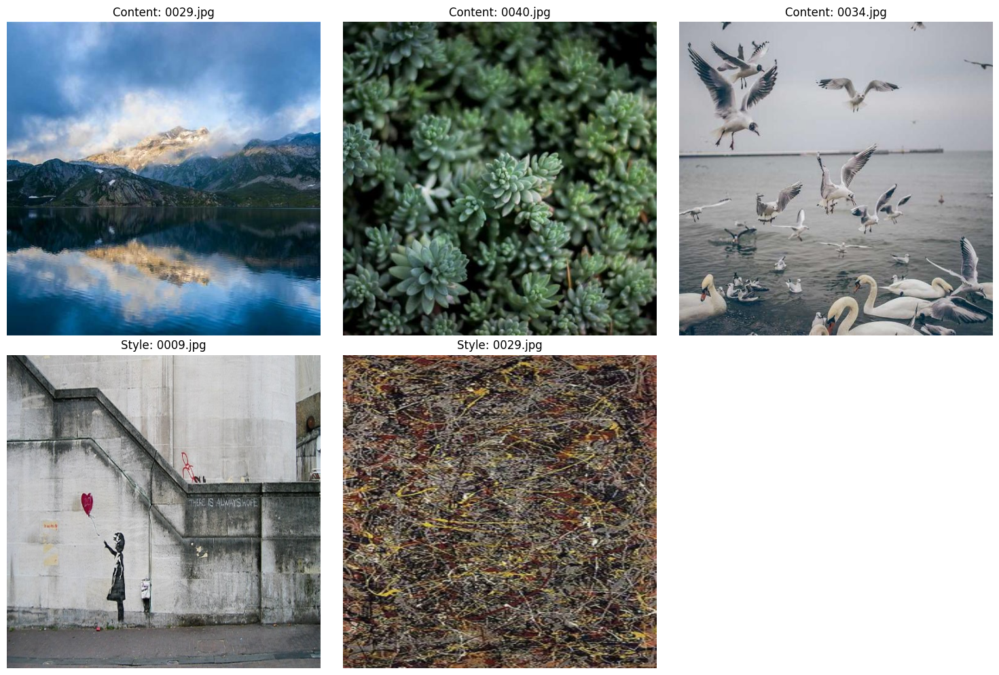

In [33]:
# Image Selection Helper

def select_images(input_dir="assets/input", reference_dir="assets/reference", n_content=5, n_style=5):
    content_images = [os.path.join(input_dir, f) for f in os.listdir(input_dir) if f.endswith('.jpg')]
    style_images = [os.path.join(reference_dir, f) for f in os.listdir(reference_dir) if f.endswith('.jpg')]
    
    selected_content = random.sample(content_images, min(n_content, len(content_images)))
    selected_style = random.sample(style_images, min(n_style, len(style_images)))
    
    print(f"Selected {len(selected_content)} content images:")
    for path in selected_content:
        print(f"  - {os.path.basename(path)}")
    
    print(f"\nSelected {len(selected_style)} style images:")
    for path in selected_style:
        print(f"  - {os.path.basename(path)}")
    
    return selected_content, selected_style

# Example usage:
content_paths, style_paths = select_images(n_content=3, n_style=2)

# Display the selected images
plt.figure(figsize=(15, 10))

# Display content images
for i, path in enumerate(content_paths):
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, max(len(content_paths), len(style_paths)), i+1)
    plt.imshow(img_rgb)
    plt.title(f"Content: {os.path.basename(path)}")
    plt.axis("off")

# Display style images
for i, path in enumerate(style_paths):
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, max(len(content_paths), len(style_paths)), i+1+max(len(content_paths), len(style_paths)))
    plt.imshow(img_rgb)
    plt.title(f"Style: {os.path.basename(path)}")
    plt.axis("off")

plt.tight_layout()
plt.show()

Processing 0029 with style 0009 using all presets...
Applying balanced style transfer to 0029.jpg with style 0009.jpg...
Loading and preprocessing images...
Applying balanced style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/0029_0009_balanced.png
Applying painterly style transfer to 0029.jpg with style 0009.jpg...
Loading and preprocessing images...
Applying painterly style transfer...
Applying painterly smoothing...
Transferring color palette...
Enhancing color vibrancy...
Simulating brush strokes...
Adding canvas texture...
Adding classical vignette...
Applying final smoothing...
Result saved to assets/_results/0029_0009_painterly.png
Applying classical style transfer to 0029.jpg with style 0009.jpg...
Loading and preprocessing images...
Applying classical style transfer...
Applying pai

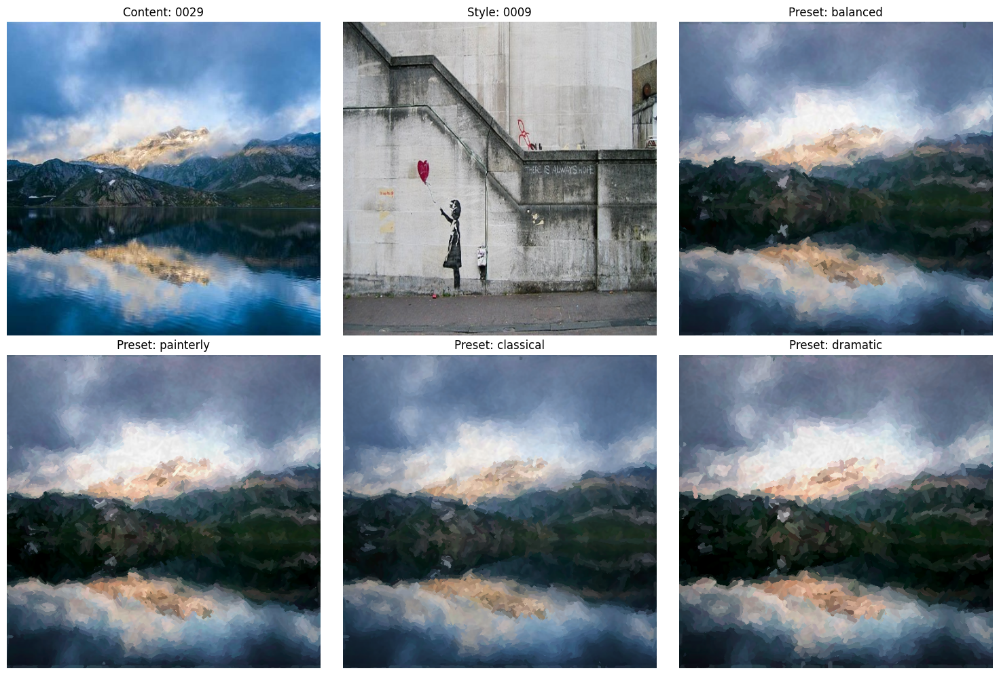

In [34]:
# Batch Processing with All Presets

def batch_process_pair(content_path, style_path):
    content_name = os.path.splitext(os.path.basename(content_path))[0]
    style_name = os.path.splitext(os.path.basename(style_path))[0]
    
    presets = ["balanced", "painterly", "classical", "dramatic"]
    results = []
    
    print(f"Processing {content_name} with style {style_name} using all presets...")
    
    for preset in presets:
        _, _, result = apply_style_transfer(
            content_path, style_path, 
            preset=preset,
            output_name=f"{content_name}_{style_name}_{preset}"
        )
        results.append((preset, result))
    
    # Display results in a grid
    plt.figure(figsize=(15, 10))
    
    # Original content
    content_img = cv2.imread(content_path)
    content_img_rgb = cv2.cvtColor(content_img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 3, 1)
    plt.imshow(content_img_rgb)
    plt.title(f"Content: {content_name}")
    plt.axis("off")
    
    # Style image
    style_img = cv2.imread(style_path)
    style_img_rgb = cv2.cvtColor(style_img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 3, 2)
    plt.imshow(style_img_rgb)
    plt.title(f"Style: {style_name}")
    plt.axis("off")
    
    # Results with different presets
    for i, (preset, result) in enumerate(results):
        plt.subplot(2, 3, i+3)
        plt.imshow(result)
        plt.title(f"Preset: {preset}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{content_name}_{style_name}_all_presets.png"))
    plt.show()

# Example usage with our selected images
if len(content_paths) > 0 and len(style_paths) > 0:
    batch_process_pair(content_paths[0], style_paths[0])

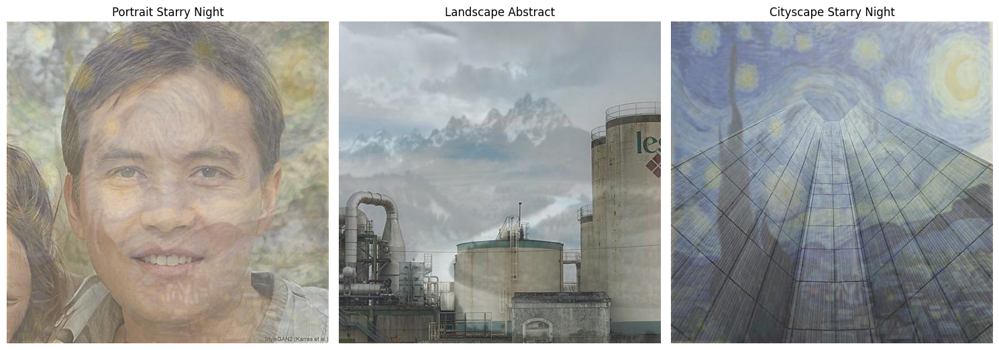

In [35]:
# Compare Existing Results

# Display some of the results in the _results directory
result_images = [
    "assets/_results/portrait_starry_night.jpg",
    "assets/_results/landscape_abstract.jpg",
    "assets/_results/cityscape_starry_night.jpg"
]

plt.figure(figsize=(15, 12))

for i, result_path in enumerate(result_images):
    if os.path.exists(result_path):
        img = cv2.imread(result_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 3, i+1)
        plt.imshow(img_rgb)
        plt.title(os.path.basename(result_path).replace('.jpg', '').replace('_', ' ').title())
        plt.axis('off')
    else:
        print(f"Result image not found: {result_path}")

plt.tight_layout()
plt.show()

In [36]:
# Conclusion